# Generative AI Challenge: Image Generation with ComfyUI

This notebook demonstrates the process of generating images and creating a simple storyboard using the [ComfyUI](https://github.com/comfyanonymous/ComfyUI) framework. It provides a basic workflow for converting textual scene descriptions into visual illustrations using a text-to-image model. The focus of this notebook is to familiarize you with ComfyUI's capabilities for image generation, without implementing any methods to maintain character consistency across different scenes.

In this notebook, you will:
- Load scene descriptions and convert them into images using ComfyUI.
- Generate visual representations of consecutive scenes for a storyboard.
- Understand the limitations of existing models in maintaining consistent character appearances across multiple generated images.

### 1. Setting Up a Python Environment for the Challenge

To get started, you need to set up a Python environment for this challenge and install the necessary libraries. Follow these steps:

1. **Creating a Python Environment**: 

    First, you will create a dedicated Python environment for the challenge. This will allow you to install the required packages without affecting other projects. To do this:
    - Open a terminal (or the Anaconda Prompt on Windows or macOS).
    - Run the following command to create a new environment. You can name it "genai_challenge" or choose your own name:

        ``conda create --name genai_challenge``

    - After creating the environment, activate it by running the command:
        
        ``conda activate genai_challenge``
        
2. **Installing Required Libraries**: 

    Most libraries needed for this challenge are standard Python libraries and come pre-installed. However, you will need to install the ``websocket-client`` library manually to access the ComfyUI's API. To install it:
    - In the terminal with your activated environment, run the following command:

        ``conda install websocket-client``

    - If you are not using a Conda environment, but another virtual environment tool, you can use the following command:
        
        ``pip install websocket-client``

3. **Selecting the Environment and Verifying the Installation**

    After setting up the environment, you need to ensure that Visual Studio Code uses the correct Python environment for this notebook:

    - At the top right corner of the window, click on "Select Kernel".
    - Select your newly created environment ("genai_challenge") from the list of available environments.

    To verify that the ``websocket-client`` library is installed correctly, you can run the following code cell:

In [1]:
import websocket
print("Websocket library installed correctly.")

Websocket library installed correctly.


If the code above runs without any errors, you are all set and ready to continue.

### 2. Basic Image Generation Using ComfyUI

Let's start by importing the libraries that we will use:

In [2]:
import uuid
import json
import urllib
import random
import io
import os
import websocket
from IPython.display import Image, display

import base64

The images in this example are generated by a Stable Diffusion model running on the ADS&AI server. There are four instances of the ComfyUI framework available on the server:
- buas1.edirlei.com
- buas2.edirlei.com
- buas3.edirlei.com
- buas4.edirlei.com

Since all participants of the Generative AI Challenge will be sharing these instances, they may become overloaded at times. If you notice that image generation is taking longer than expected or encounter access errors while trying to run this notebook, try switching to another instance.

Next, we'll specify which ComfyUI instance to use by assigning its address to the variable `comfyui_server_address`. Additionally, we need to define the path to the ComfyUI workflow that we'll use for this task, assigning it to comfyui_juggernaut_xl_workflow_path. This workflow configures ComfyUI to generate the images according to a standard text-to-image process using the Juggernaut XL model. You can read more about ComfyUI and ComfyUI workflows [here](https://stable-diffusion-art.com/comfyui/).

In [3]:
comfyui_server_address = "buas1.edirlei.com"
comfyui_juggernaut_xl_workflow_path = "./workflow_juggernaut_xl.json"
comfyui_client_id = str(uuid.uuid4())
comfyui_username = "adsai"
comfyui_password = "uuUP4whjX29cF3cxwrX3SY5Mm9TmtASkdgpaNCTHZ9"
comfyui_credentials = base64.b64encode(f"{comfyui_username}:{comfyui_password}".encode('utf-8')).decode('utf-8')
comfyui_auth_header = f"Basic {comfyui_credentials}"

To generate images in ComfyUI from Python, we need to interact with several API endpoints provided by ComfyUI. The functions defined below will handle this process for you, so you don't need to worry about the technical details of accessing these endpoints.

That said, if you wish to use a different workflow in the future, you may need to customize the function ``comfyui_generate_image_juggernaut_xl``. The current version of this function is configured to work with a simple workflow that utilizes the [Juggernaut XL](https://civitai.com/models/133005?modelVersionId=357609) model.

In [4]:
def comfyui_queue_prompt(prompt):
    p = {"prompt": prompt, "client_id": comfyui_client_id}
    data = json.dumps(p).encode('utf-8')
    req = urllib.request.Request(f"http://{comfyui_server_address}/prompt", data=data, headers = {"Authorization": comfyui_auth_header})
    return json.loads(urllib.request.urlopen(req).read())

def comfyui_get_image(filename, subfolder, folder_type):
    data = {"filename": filename, "subfolder": subfolder, "type": folder_type}
    url_values = urllib.parse.urlencode(data)
    req = urllib.request.Request(f"http://{comfyui_server_address}/view?{url_values}", headers = {"Authorization": comfyui_auth_header})
    with urllib.request.urlopen(req) as response:
        return response.read()

def comfyui_get_history(prompt_id):
    req = urllib.request.Request(f"http://{comfyui_server_address}/history/{prompt_id}", headers = {"Authorization": comfyui_auth_header})
    with urllib.request.urlopen(req) as response:
        return json.loads(response.read())

def comfyui_get_images(ws, prompt):
    prompt_id = comfyui_queue_prompt(prompt)['prompt_id']
    output_images = {}
    while True:
        out = ws.recv()
        if isinstance(out, str):
            message = json.loads(out)
            if message['type'] == 'executing':
                data = message['data']
                if data['node'] is None and data['prompt_id'] == prompt_id:
                    break 
        else:
            continue

    history = comfyui_get_history(prompt_id)[prompt_id]
    for o in history['outputs']:
        for node_id in history['outputs']:
            node_output = history['outputs'][node_id]
            if 'images' in node_output:
                images_output = []
                for image in node_output['images']:
                    image_data = comfyui_get_image(image['filename'], image['subfolder'], image['type'])
                    images_output.append(image_data)
            output_images[node_id] = images_output

    return output_images

def comfyui_generate_image_juggernaut_xl(prompt, negative_prompt, seed, output_filename):
    with open(comfyui_juggernaut_xl_workflow_path, "r") as file:
        workflowdata = json.load(file)

    if seed == -1:
        seed = random.randint(0, 2**32 - 1)

    # depending on the workflow used, these nodes need to be adjusted (see file workflow_juggernaut_xl.json)
    workflowdata["6"]["inputs"]["text"] = prompt
    workflowdata["7"]["inputs"]["text"] = negative_prompt    
    workflowdata["3"]["inputs"]["seed"] = seed

    ws = websocket.WebSocket()
    ws.connect("ws://{}/ws?clientId={}".format(comfyui_server_address, comfyui_client_id), header={"Authorization": comfyui_auth_header})
    images = comfyui_get_images(ws, workflowdata)

    if len(images) > 0:
        bytestream = io.BytesIO(images["9"][0])
        with open(output_filename, "wb") as outfile:
            outfile.write(bytestream.getbuffer())


To generate an image, we will use the function `comfyui_generate_image_juggernaut_xl`. Below are the parameters that this function accepts:
- `prompt`: The main prompt used for the image generation, describing what the model should depict.
- `negative_prompt`: A prompt that specifies what the model should avoid including in the image. This helps refine the output by filtering unwanted elements.
- `seed`: The seed used for image generation. Using the same seed with the same prompts will consistently produce the same image. If you would like a random seed for each generation, set this value to -1.
- `output_filename`: The file path where the generated image will be saved.

In [5]:
comfyui_generate_image_juggernaut_xl("A serene lakeside at sunset, reflecting the vibrant colors of the sky", "", -1, "my_first_test_comfyui.png")

In [7]:
comfyui_generate_image_juggernaut_xl("A person walking over a bridge, looking peacefully into the sky", "", -1, "my_first_test_comfyui1.png")

After generating the image, we can visualize it:

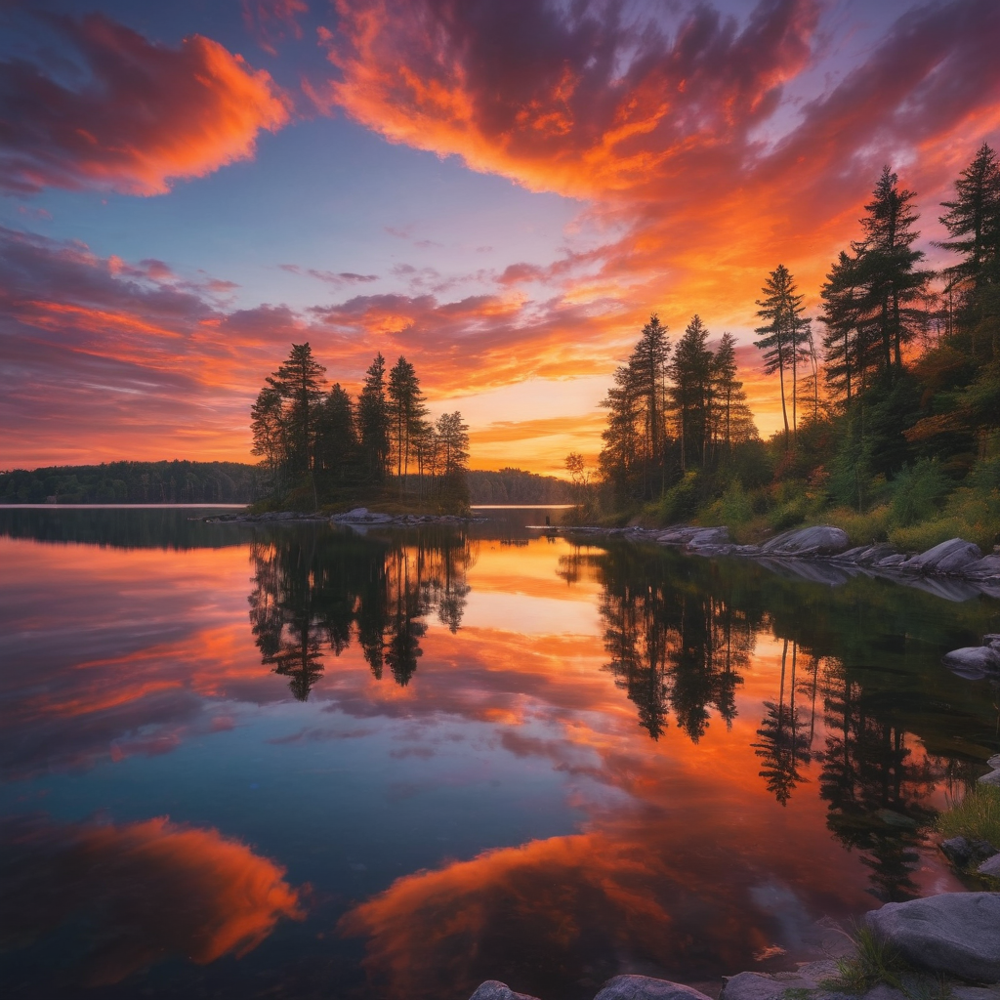

In [ ]:
display(Image(filename="my_first_test_comfyui.png", width=500))

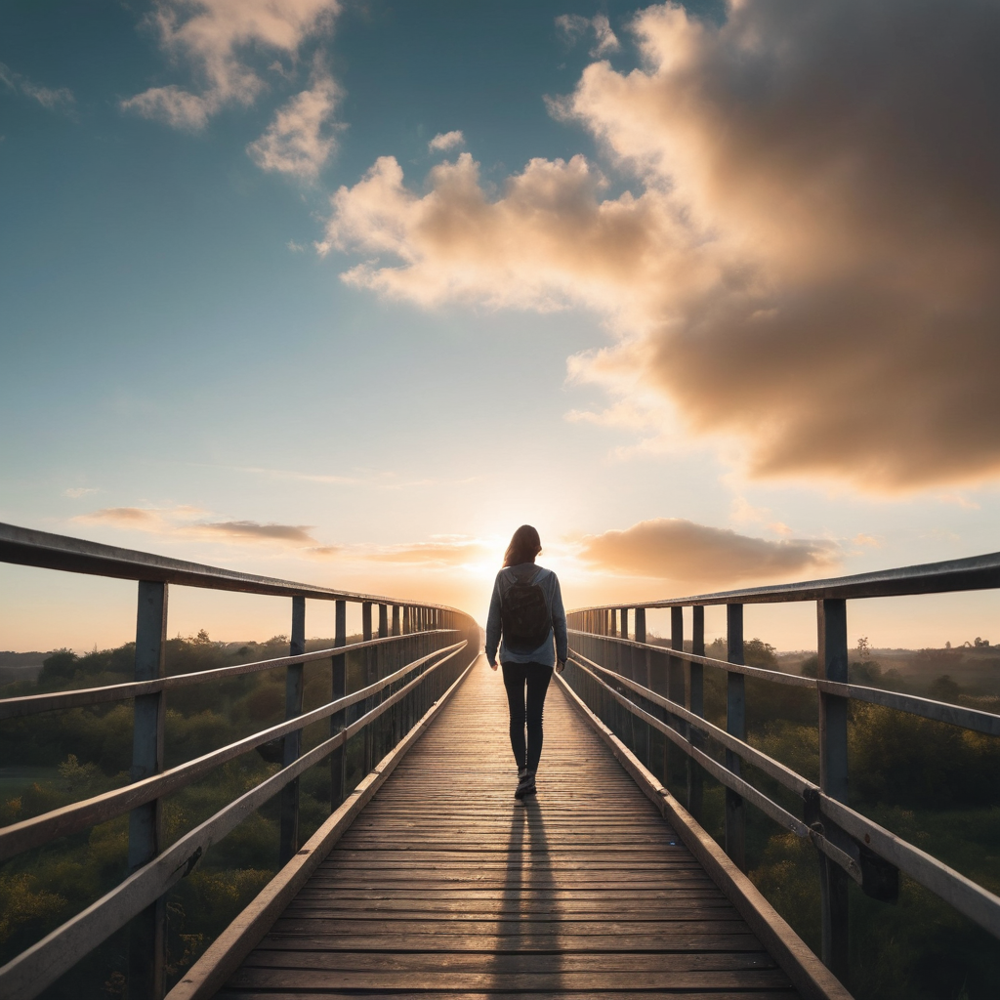

In [8]:
display(Image(filename="my_first_test_comfyui1.png", width=500))

### 3. Generating a Storyboard with ComfyUI

Now that you know how to generate individual images, let's explore how to create an image sequence within a storyboard context.

A storyboard represents a sequence of events that together form a story. We can store this sequence of events in a list, where each item describes a scene in the story:

In [9]:
story_1 = ["Elara stares at an old map spread out on a wooden table, her hand resting on a lantern. She wears a worn leather jacket, and a satchel hangs at her side. The dim light flickers as she studies the map, deep in thought.", 
           "Elara hikes through a dense jungle, using a machete to clear her path. Sweat drips down her forehead, and her satchel bounces with each step. The sun filters through the thick canopy above her.",
           "Elara stands at the entrance of an ancient stone temple, the wind whipping her hair. She adjusts her satchel and steps forward, determination in her eyes.",
           "Inside the temple, Elara examines carvings on the wall, her lantern illuminating the worn stone. Her jacket is now unzipped, revealing a plain shirt underneath, as she runs her fingers over the markings.",
           "Elara crouches beside a hidden chest, carefully prying it open. Inside, a glowing artifact rests on a bed of cloth. She glances around warily before gently lifting the artifact into her hands.",
           "Elara races through the temple corridors, the artifact glowing brightly in her satchel. Her jacket flutters behind her as she dodges crumbling debris, her expression a mix of fear and urgency.",
           "Outside the temple, Elara catches her breath, standing on a cliff with the jungle stretching out below. She looks at the artifact in her hand, a relieved smile spreading across her face as the sun sets behind her."]

Once we have defined the sequence of events, we can call the function `comfyui_generate_image_juggernaut_xl` for each story event to generate the corresponding scene illustrations:

In [10]:
os.makedirs(".//images", exist_ok=True)  # create a subfolder to store the generated images

for i in range(len(story_1)):
    comfyui_generate_image_juggernaut_xl(story_1[i], "", -1, ".//images//story_1_scene_" + str(i + 1) + ".png")

Finally, we can display the generated images along with the corresponding text for each story event to create a storyboard representation:

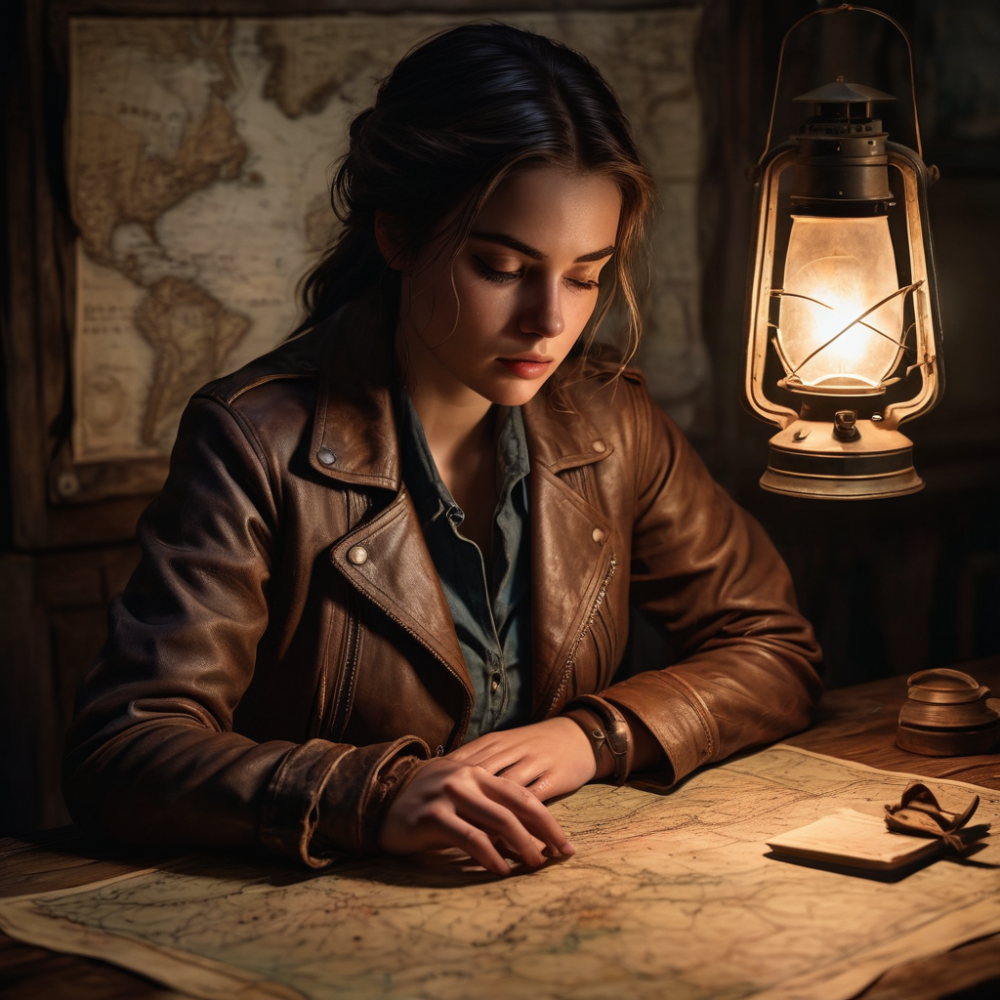

Elara stares at an old map spread out on a wooden table, her hand resting on a lantern. She wears a worn leather jacket, and a satchel hangs at her side. The dim light flickers as she studies the map, deep in thought.


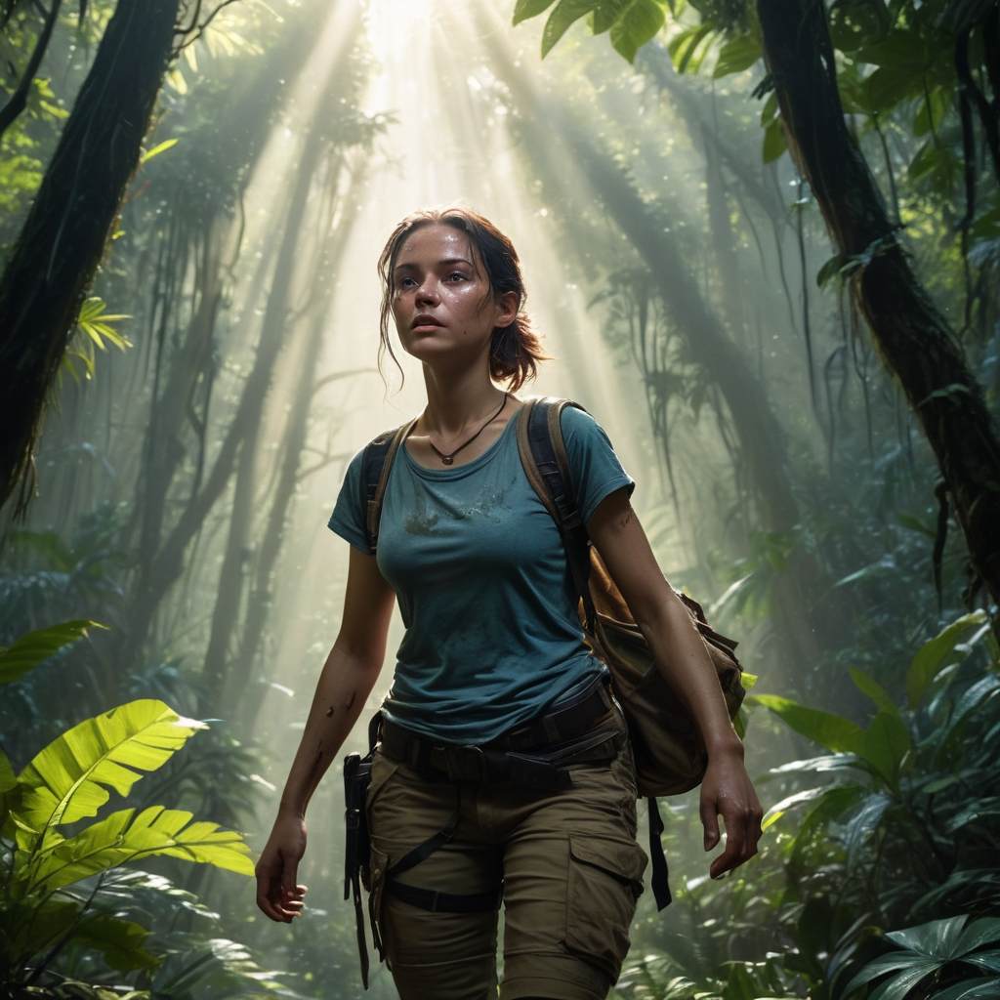

Elara hikes through a dense jungle, using a machete to clear her path. Sweat drips down her forehead, and her satchel bounces with each step. The sun filters through the thick canopy above her.


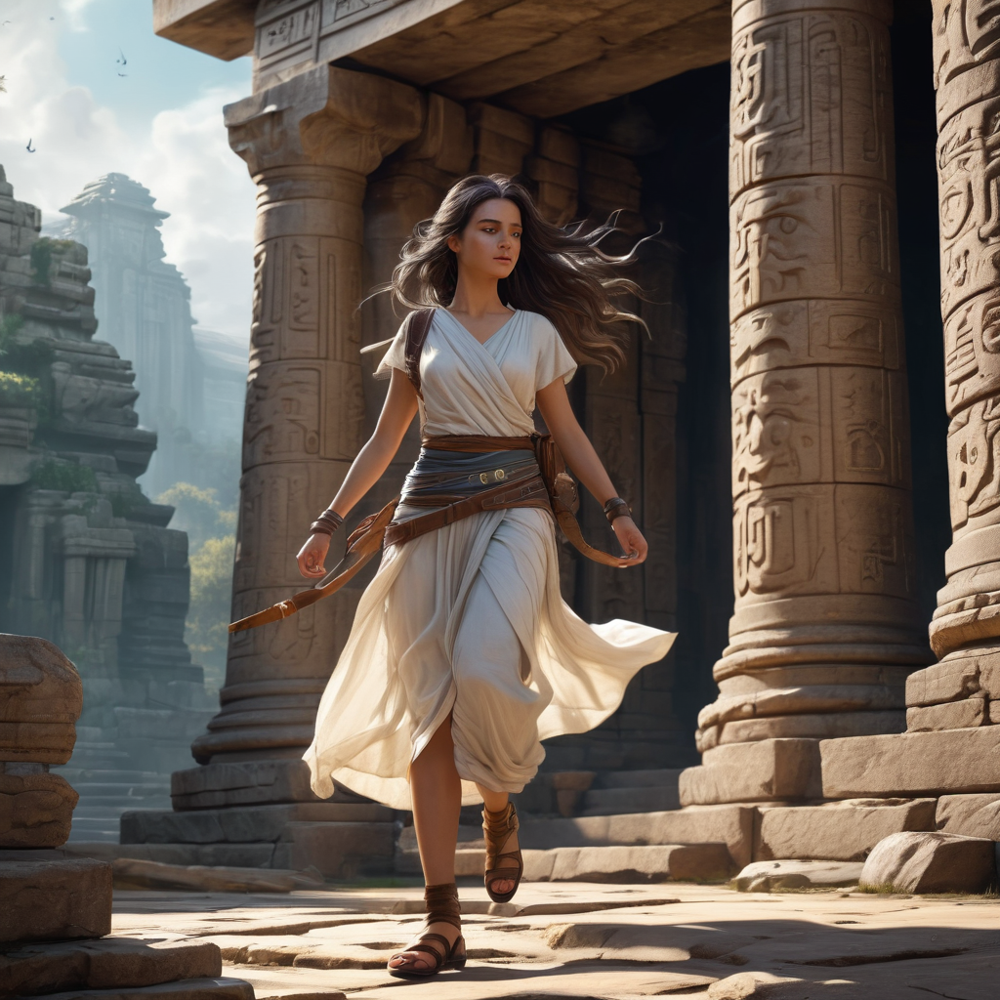

Elara stands at the entrance of an ancient stone temple, the wind whipping her hair. She adjusts her satchel and steps forward, determination in her eyes.


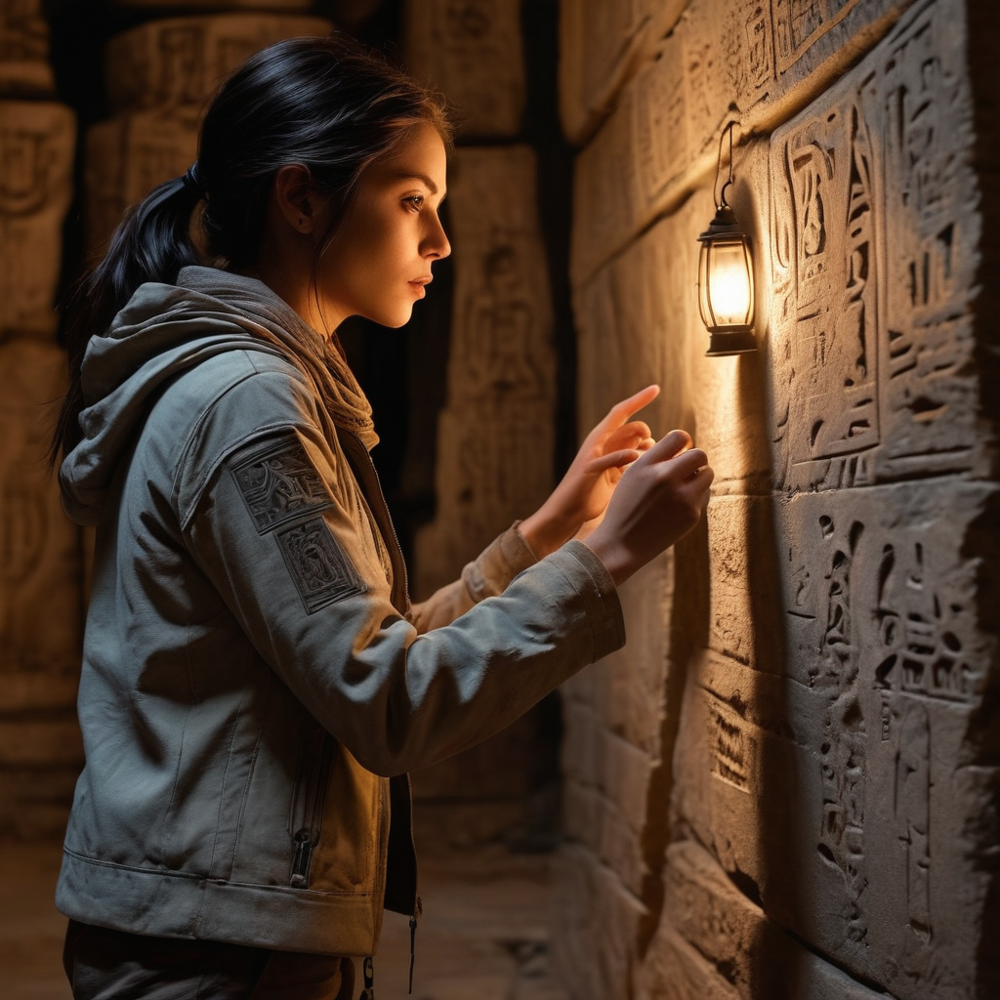

Inside the temple, Elara examines carvings on the wall, her lantern illuminating the worn stone. Her jacket is now unzipped, revealing a plain shirt underneath, as she runs her fingers over the markings.


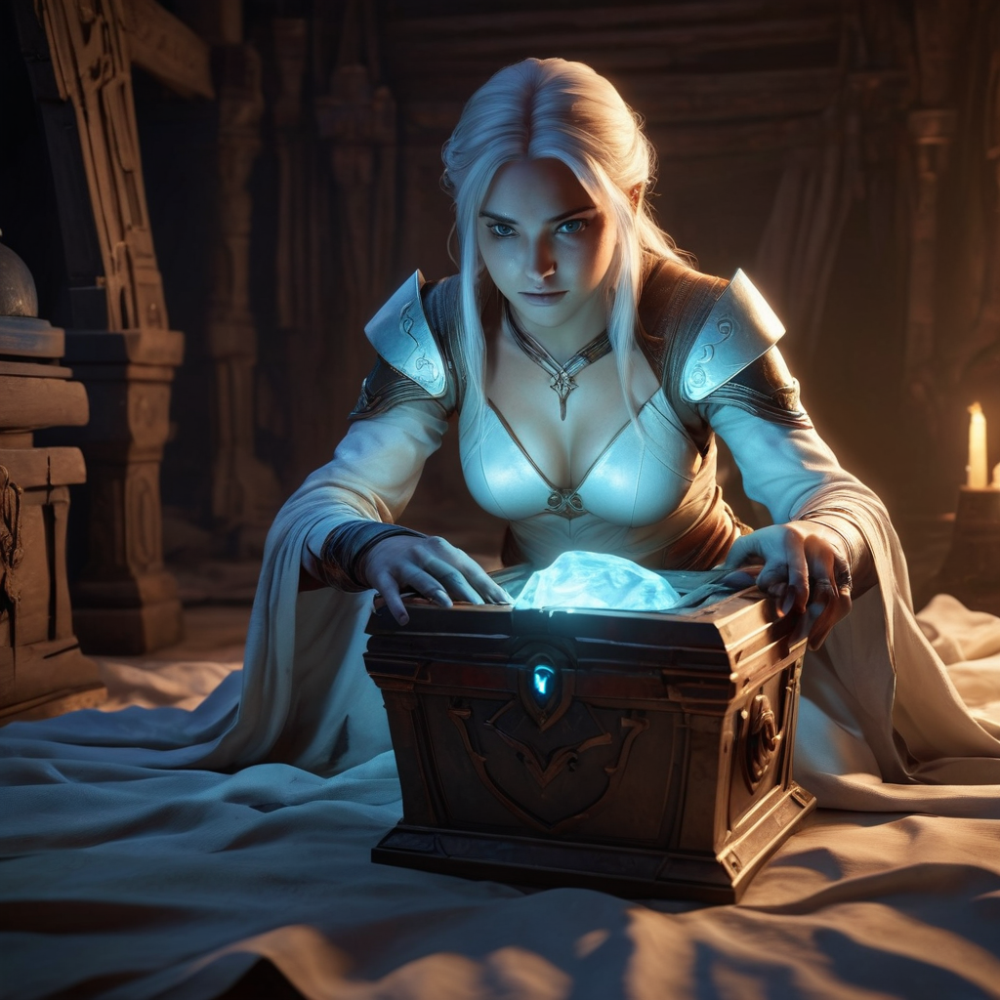

Elara crouches beside a hidden chest, carefully prying it open. Inside, a glowing artifact rests on a bed of cloth. She glances around warily before gently lifting the artifact into her hands.


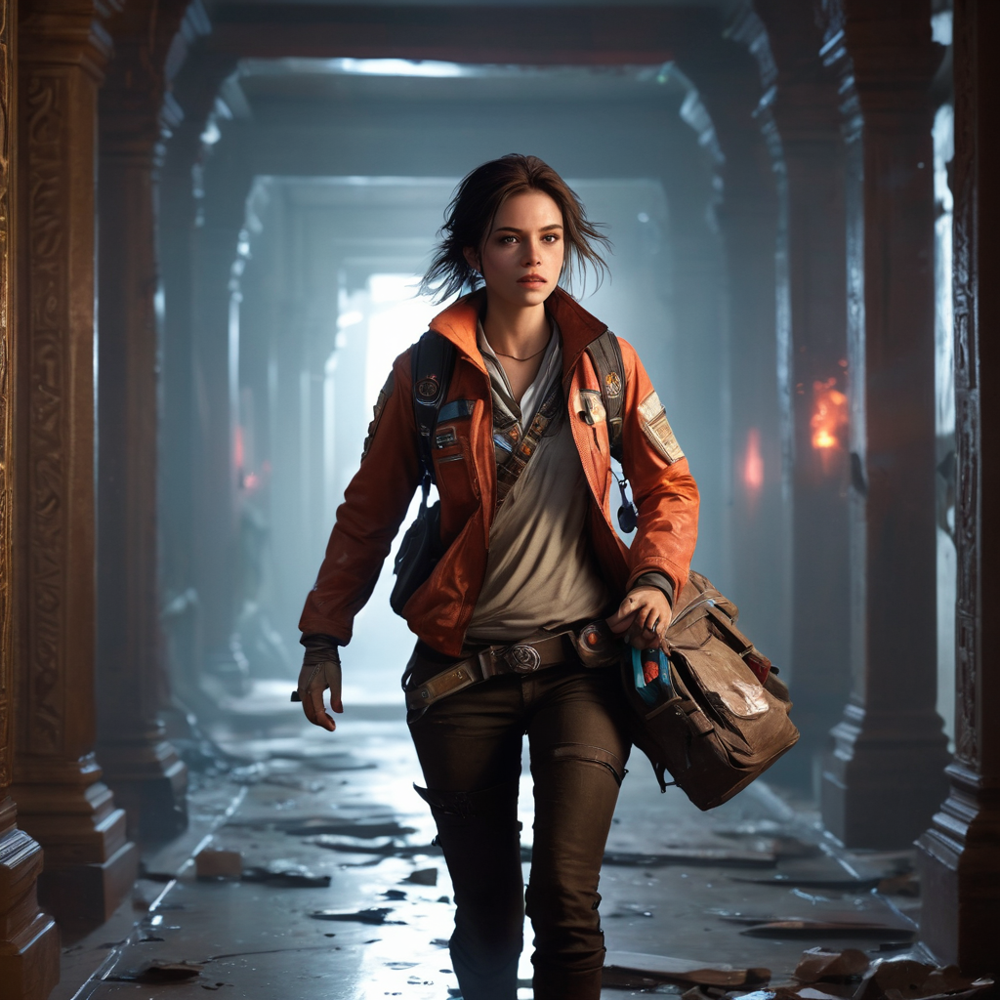

Elara races through the temple corridors, the artifact glowing brightly in her satchel. Her jacket flutters behind her as she dodges crumbling debris, her expression a mix of fear and urgency.


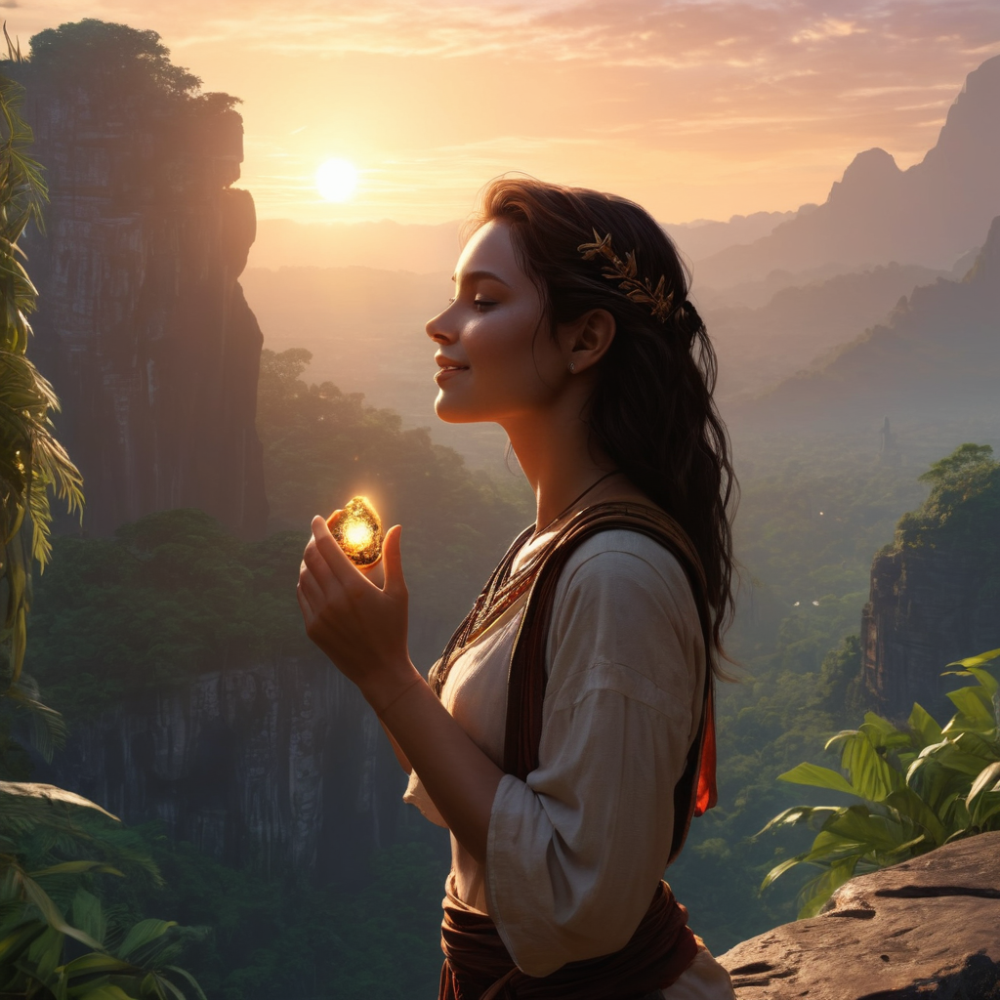

Outside the temple, Elara catches her breath, standing on a cliff with the jungle stretching out below. She looks at the artifact in her hand, a relieved smile spreading across her face as the sun sets behind her.


In [11]:
for i in range(len(story_1)):
    display(Image(filename=".//images//story_1_scene_" + str(i + 1) + ".png", width=400))
    print(story_1[i])

Although the generated storyboard looks visually appealing, it is clear that the main character, Elara, is represented inconsistently across the scenes. She appears with different physical attributes and completely different clothing, even in situations where she should be wearing the same outfit.

**This brings us to your challenge: how can you improve character consistency in image sequences like the one illustrated in this notebook?**